In [1]:
import numpy as np
import scipy as sp
import scipy.stats
from matplotlib import pyplot as pp
%matplotlib inline

In [2]:
import os, re

In [3]:
from utils import Frame

In [4]:
from scores import *

In [5]:
dataset = "smda"
order = "density density_half density_stepped density_full"\
    " mixture mixture_re mixture_half mixture_stepped mixture_full" \
    " doho60 doho70 doho80 doho90" \
    " dohe60 dohe70 dohe80 dohe90" \
    " ens-pairs ensemble-pairs ensemble-pairs-12 ensemble-pairs-6 ensemble-pairs-3 ensemble-pairs-balanced" \
    " ens-residuals ensemble-residuals ensemble-residuals-12 ensemble-residuals-6 ensemble-residuals-3 ensemble-residuals-balanced" \
    " knn-mseq knn-mse knn-dev knn-avgdist knn-vary " \
    " dummy-const".split()
path = os.path.join("trained_models", dataset)
folders = os.listdir(path)
estimators = []
for folder in folders:
    if os.path.exists(os.path.join(path, folder, "pr_te.npz")):
        estimators += [folder]
estimators = list(sorted(estimators, key=lambda x: order.index(x)))
estimators.remove('dummy-const')
print(estimators)

['density', 'density_half', 'density_stepped', 'density_full', 'mixture_re', 'mixture_half', 'mixture_stepped', 'mixture_full', 'doho70', 'doho80', 'doho90', 'ensemble-pairs', 'ensemble-pairs-12', 'ensemble-pairs-6', 'ensemble-pairs-3', 'ensemble-residuals', 'ensemble-residuals-12', 'ensemble-residuals-6', 'ensemble-residuals-3', 'knn-mseq', 'knn-mse', 'knn-dev', 'knn-avgdist', 'knn-vary']


In [6]:
def load(path=None, model="ensemble-pairs"):
    setnames = ['tr', 'va', 'te', 'de', 'special']
    sets = dict((k,Frame(np.load(os.path.join(path,"%s.npz"%k))))
                for k in setnames
                if os.path.exists(os.path.join(path,"%s.npz"%k)))
    prs = dict((k,Frame(np.load(os.path.join(path,model,"pr_%s.npz"%k))))
                for k in setnames
                if os.path.exists(os.path.join(path,model,"pr_%s.npz"%k)))
    return sets, prs
prSE = {} # pr[Setname][Estimator]
for est in estimators:
    sets, prs = load(path=path, model=est)
    for setname in sets.keys():
        if setname not in prSE: prSE[setname] = dict()
        try:
            prSE[setname][est] = prs[setname]
        except Exception as e:
            print(setname, est)
print(prSE.keys())

dict_keys(['de', 'va', 'special', 'tr', 'te'])


In [13]:
# choose a set to evaluate
EVALSET = 'special'

In [32]:
for n,pr in ((n,prSE[EVALSET][n]) for n in estimators):
    print(pr["Y"].shape, pr["T"].shape, n)

(666977,) (666977,) density
(666977,) (666977,) density_half
(666977,) (666977,) density_stepped
(666977,) (666977,) density_full
(666977,) (666977,) mixture_re
(666977,) (666977,) mixture_half
(666977,) (666977,) mixture_stepped
(666977,) (666977,) mixture_full
(666977,) (666977,) doho70
(666977,) (666977,) doho80
(666977,) (666977,) doho90
(666977,) (666977,) dohe70
(666977,) (666977,) dohe80
(666977,) (666977,) dohe90
(666977,) (666977,) ensemble-pairs
(666977,) (666977,) ensemble-pairs-12
(666977,) (666977,) ensemble-pairs-6
(666977,) (666977,) ensemble-pairs-3
(666977,) (666977,) ensemble-pairs-balanced
(666977,) (666977,) ensemble-residuals
(666977,) (666977,) ensemble-residuals-12
(666977,) (666977,) ensemble-residuals-6
(666977,) (666977,) ensemble-residuals-3
(666977,) (666977,) knn-mseq
(666977,) (666977,) knn-mse
(666977,) (666977,) knn-dev
(666977,) (666977,) knn-avgdist
(666977,) (666977,) knn-vary


In [14]:
# print(((pr["T"] - pr["T"].mean())**2).mean()**0.5, "mean guess rmse")
for n,pr in ((n,prSE[EVALSET][n]) for n in estimators):
    rmse = ((pr["T"] - pr["Y"])**2).mean()**0.5 
    print("{:6.4f}".format(rmse), n, EVALSET, "rmse")

0.2401 density special rmse
0.2764 density_half special rmse
0.2343 density_stepped special rmse
0.2249 density_full special rmse
0.3207 mixture_re special rmse
0.2502 mixture_half special rmse
0.3932 mixture_stepped special rmse
0.3356 mixture_full special rmse
0.3276 doho70 special rmse
0.3136 doho80 special rmse
0.3028 doho90 special rmse
0.1710 ensemble-pairs special rmse
0.1789 ensemble-pairs-12 special rmse
0.1845 ensemble-pairs-6 special rmse
0.2036 ensemble-pairs-3 special rmse
0.2008 ensemble-residuals special rmse
0.2021 ensemble-residuals-12 special rmse
0.2046 ensemble-residuals-6 special rmse
0.2077 ensemble-residuals-3 special rmse
0.2369 knn-mseq special rmse
0.2369 knn-mse special rmse
0.2369 knn-dev special rmse
0.2369 knn-avgdist special rmse
0.2369 knn-vary special rmse


In [34]:
for n,pr in ((n,prSE[EVALSET][n]) for n in estimators):
    print("{:10d}".format(len(np.unique(pr['maxY']-pr['minY']))), 'unique values in U of', n)

    666948 unique values in U of density
    666960 unique values in U of density_half
    666956 unique values in U of density_stepped
    666945 unique values in U of density_full
    666963 unique values in U of mixture_re
    666951 unique values in U of mixture_half
    666960 unique values in U of mixture_stepped
    666966 unique values in U of mixture_full
    666973 unique values in U of doho70
    666972 unique values in U of doho80
    666966 unique values in U of doho90
    666966 unique values in U of dohe70
    666961 unique values in U of dohe80
    666962 unique values in U of dohe90
    666962 unique values in U of ensemble-pairs
    666966 unique values in U of ensemble-pairs-12
    666964 unique values in U of ensemble-pairs-6
    666967 unique values in U of ensemble-pairs-3
    666949 unique values in U of ensemble-pairs-balanced
    666952 unique values in U of ensemble-residuals
    666962 unique values in U of ensemble-residuals-12
    666965 unique values in U 

In [8]:
from evaluation import score, scoretable, table2tex, table_transpose
%autoreload 2

def score_to_file(predictions, filename='tex/scores.tex'):
    scores = {}
    for name,pr in predictions.items():
        scores[name] = score(pr)
        if scores[name]['pearson_p'] > 0:
            print("WARNING: Pearson p =", scores[name]['pearson_p'], 'for', name)
    # f1 precision recall
    score_order = "rmse coverage ace pearson mpiw nmpiw rmpiw capi cec cwc cwc2 cwc3 winkler_score".split()
    table = scoretable(scores, est_keys=estimators, score_keys=score_order)
#     table = table[:1] + [["Time"]+[get_fitting_time(n, dataset) for n in estimators]] + table[1:]
    table = table_transpose(table)
    text = table2tex(table)
    with open(filename, "w") as file:
        file.write(text)

special
density


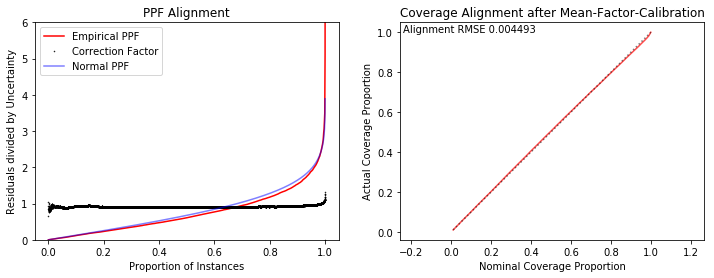

0.95 density
density_half


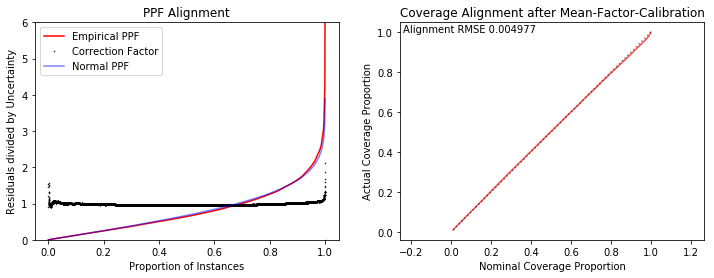

0.95 density_half
density_stepped


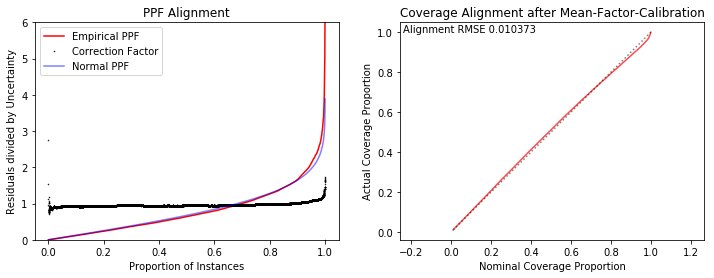

0.95 density_stepped
density_full


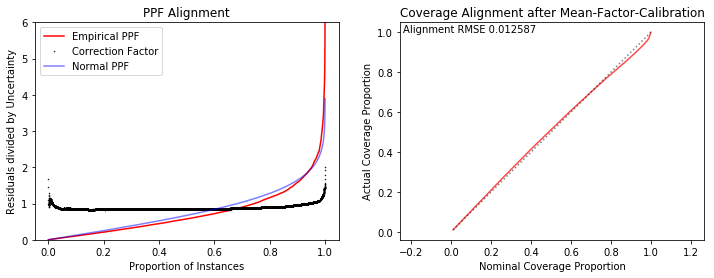

0.95 density_full
mixture_re


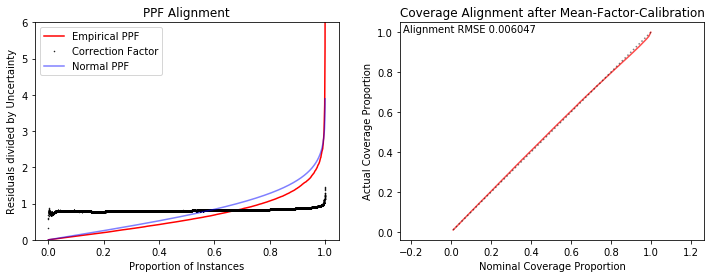

0.95 mixture_re
mixture_half


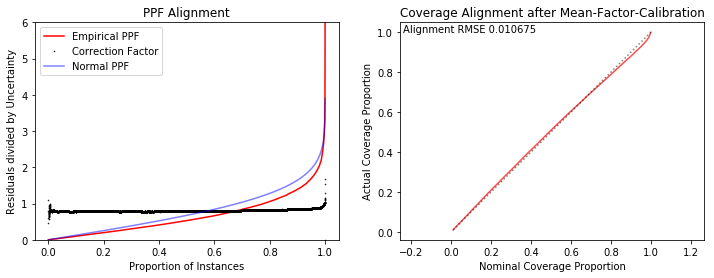

0.95 mixture_half
mixture_stepped


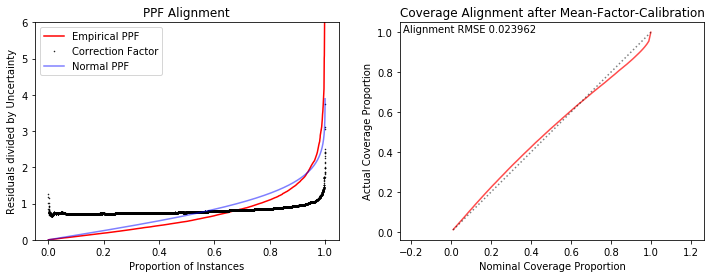

0.95 mixture_stepped
mixture_full


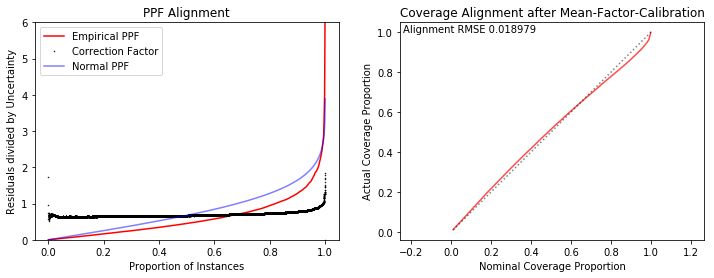

0.95 mixture_full
doho70


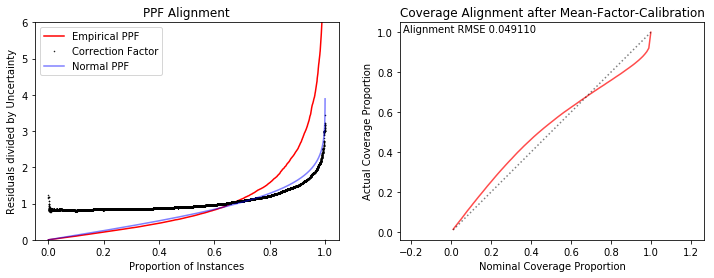

0.95 doho70
doho80


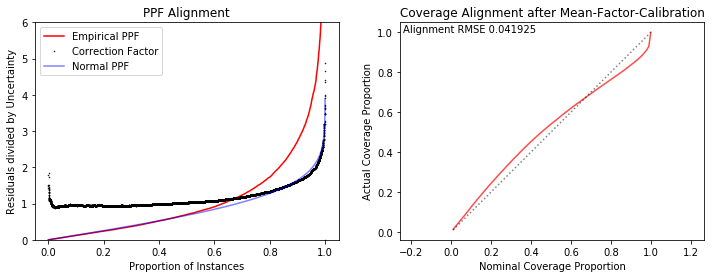

0.95 doho80
doho90


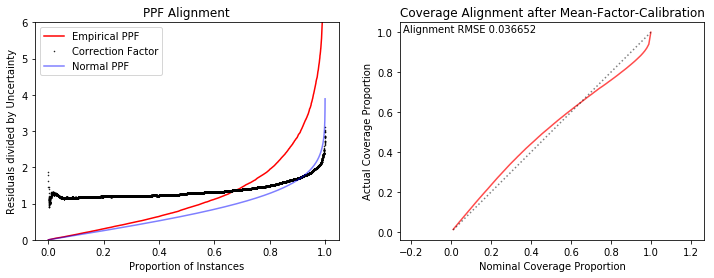

0.95 doho90
ensemble-pairs


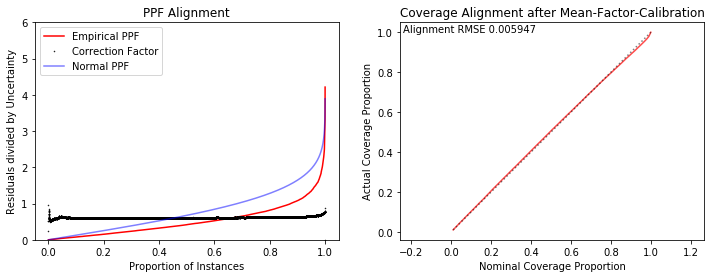

0.95 ensemble-pairs
ensemble-pairs-12


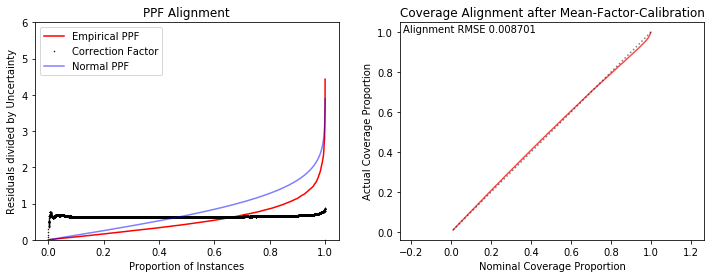

0.95 ensemble-pairs-12
ensemble-pairs-6


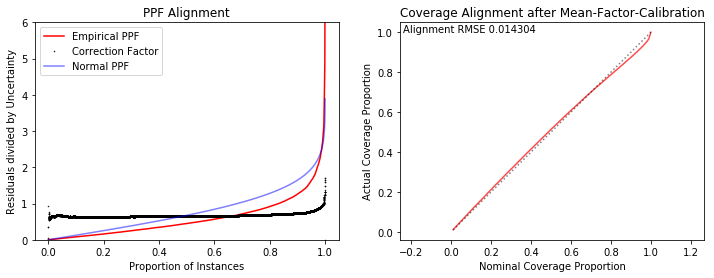

0.95 ensemble-pairs-6
ensemble-pairs-3


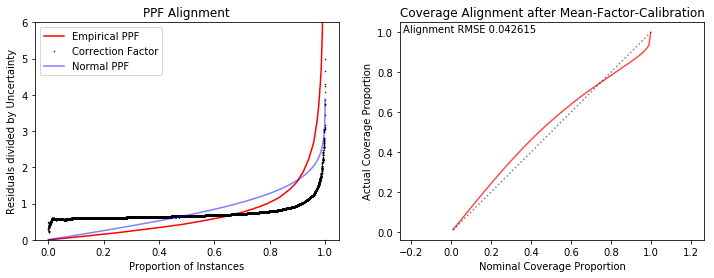

0.95 ensemble-pairs-3
ensemble-residuals


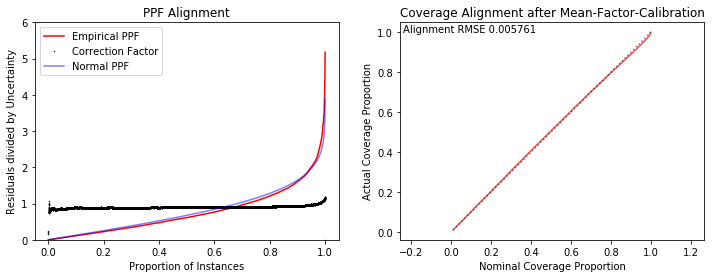

0.95 ensemble-residuals
ensemble-residuals-12


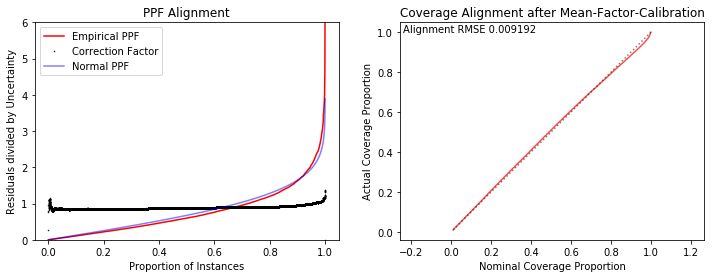

0.95 ensemble-residuals-12
ensemble-residuals-6


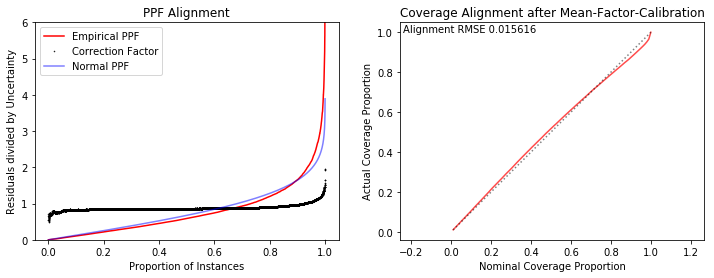

0.95 ensemble-residuals-6
ensemble-residuals-3


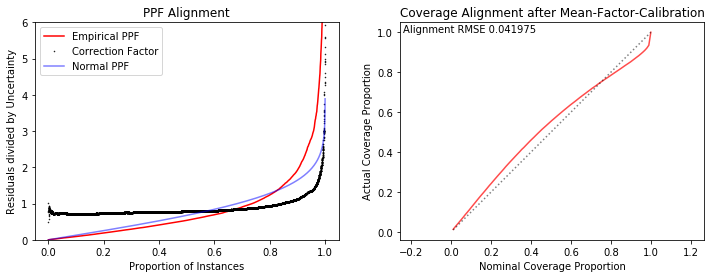

0.95 ensemble-residuals-3
knn-mseq


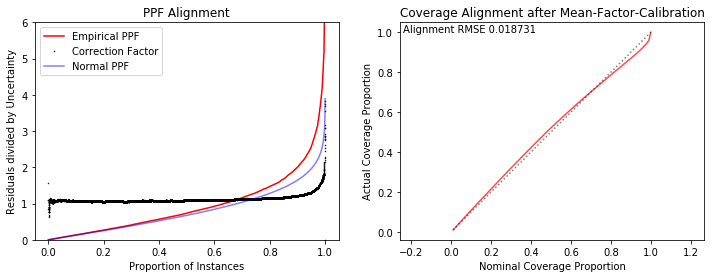

0.95 knn-mseq
knn-mse


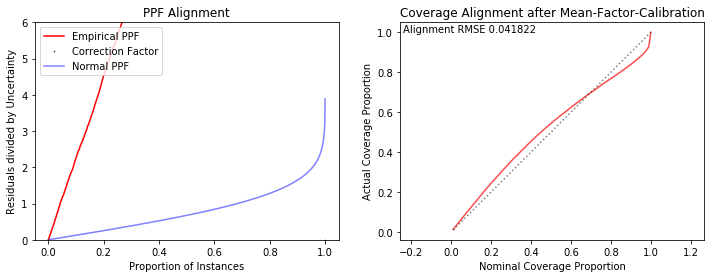

0.95 knn-mse
knn-dev


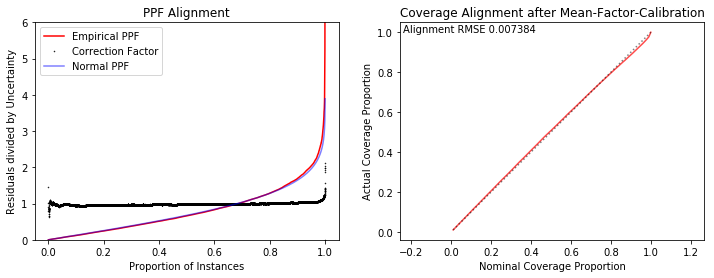

0.95 knn-dev
knn-avgdist


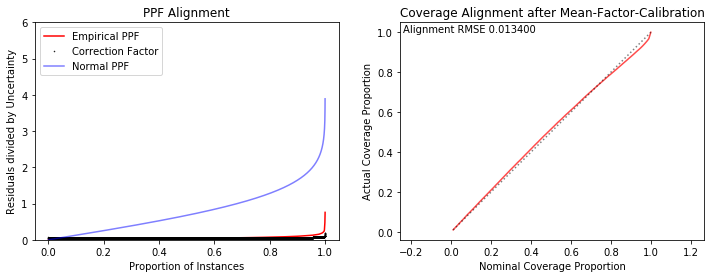

0.95 knn-avgdist
knn-vary


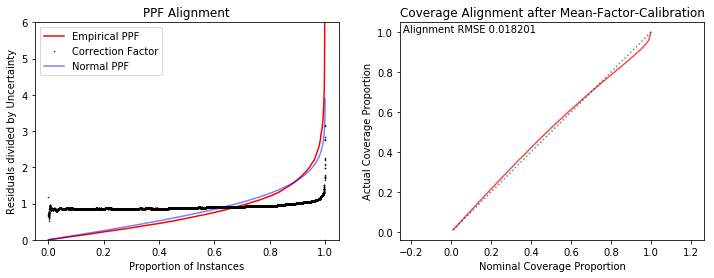

0.95 knn-vary


In [15]:
import scipy.stats
from uncertainty.wrapper import UncertaintyWrapper
from plots import plot_coverage_alignment
est = UncertaintyWrapper(None) # just need the methods of the abstract class

raw = {}

print(EVALSET)
calibrated = dict(mean={}, ppf={})
for name,pr in ((n,prSE['va'][n]) for n in estimators):
    # pick proper ppf
    ppf = None
    if re.match(r'^doho', name) is not None: # dropout variance (homoscedastic), 50 predictions
        # actually, dropout uncertainty doesn't look to be t-distributed
        ppf = lambda x: scipy.stats.t.ppf(x, df=50)
    elif re.match(r'^ens', name) is not None:
        ppf = lambda x: scipy.stats.t.ppf(x, df=24) # ensembles, 24 members
    else:
        ppf = scipy.stats.norm.ppf
    Y, prY, prU = pr['T'], pr['Y'], (pr['maxY'] - pr['minY'])/2
    # assume scaling to 0.95 coverage and remove it (just for the plots)
    if ppf != None:
        prU = prU/ppf(1-0.05/2)
    
    factor = est.calibrate(Y, prY, prU, ppf=ppf)
    prU = (prSE[EVALSET][name]['maxY'] - prSE[EVALSET][name]['minY'])/2
    if ppf != None:
        prU = prU/ppf(1-0.05/2)
        pr_ = prSE[EVALSET][name]
        raw[name] = {'T':pr_['T'], 'Y':pr_['Y'], 'minY':pr_['Y']-prU, 'maxY':pr_['Y']+prU, 'index':pr_['index']}
    
    print(name)
    pp.figure(figsize=(12,4))
    pp.subplot(121)
    X = np.linspace(0,1,len(Y))[1:]
    pp.plot(X, est._ppf(X), "r-", label="Empirical PPF")
    pp.plot(X, est._ppf(X)/ppf((1+X)/2), "k.", ms=1, label="Correction Factor")
    pp.plot(X, scipy.stats.norm.ppf((1+X)/2), "b-", label="Normal PPF", alpha=0.5)
    pp.ylim([0,6])
    pp.title("PPF Alignment")
    pp.xlabel('Proportion of Instances')
    pp.ylabel('Residuals divided by Uncertainty')
    pp.legend(loc='upper left')
    pp.subplot(122)
    plot_coverage_alignment(prSE[EVALSET][name]['T'], prSE[EVALSET][name]['Y'], factor*prU, ppf=ppf)
    pp.title("Coverage Alignment after Mean-Factor-Calibration")
    path = os.path.join("figs", dataset, EVALSET, "alignment")
    os.makedirs(path, exist_ok=True)
    for ext in "jpg pdf".split():
        pp.savefig(os.path.join(path,"%s.%s"%(name,ext)), dpi=300)
    pp.show()
    
    # mean scaling
    pr = dict()
    pr['T'] = prSE[EVALSET][name]['T']
    pr['Y'], pr['minY'], pr['maxY'] = est.scale(prSE[EVALSET][name]['Y'], prU, coverage=0.95, ppf=ppf)
    calibrated['mean'][name] = pr
    
    # pointwise scaling
    pr = dict()
    pr['T'] = prSE[EVALSET][name]['T']
    pr['Y'], pr['minY'], pr['maxY'] = est.scale(prSE[EVALSET][name]['Y'], prU, coverage=0.95, ppf=None)
    calibrated['ppf'][name] = pr
    
    # test coverage on the va set
    Y, prY, minY, maxY = [prSE['va'][name][k] for k in "T Y minY maxY".split()]
    prU = (maxY - minY)/2
    if ppf != None:
        prU = prU/ppf(1-0.05/2)
    factor = est.eppf(0.95)
    cp = coverage_percentage(Y, prY, prY-factor*prU, prY + factor*prU)
    print(cp, name)

In [16]:
path = os.path.join("tex",dataset,EVALSET,"scores")
os.makedirs(path,exist_ok=True)
score_to_file(prSE[EVALSET], os.path.join(path, "unscaled.tex"))
score_to_file(calibrated['mean'], os.path.join(path, "mean-scaled.tex"))
score_to_file(calibrated['ppf'], os.path.join(path, "ppf-scaled.tex"))

In [135]:
prSE[EVALSET].keys()

dict_keys(['knn-mseq', 'density', 'knn-mse', 'doho90', 'mixture_stepped', 'doho60', 'density_full', 'density_stepped', 'doho80', 'mixture_half', 'doho70', 'knn-vary', 'density_half', 'knn-dev', 'mixture_full', 'knn-avgdist', 'mixture_re'])

In [10]:
%autoreload 2

In [11]:
from plots import *
from plots import translate

In [17]:
from utils import ecdf
print(EVALSET)
path = os.path.join('figs', dataset, EVALSET)
print(path)

def save(filepath, exts=('jpg', 'pdf')):
    os.makedirs(os.path.dirname(filepath), exist_ok=True)
    for ext in exts:
        pp.savefig('{}.{}'.format(filepath, ext), bbox_inches='tight', dpi=300)

def plot(path, Y, prY, minY, maxY):
    prU = (maxY - minY)/2
    E = np.abs(Y - prY)
    exts = ('jpg', 'pdf')

    pp.figure(figsize=(4,4))
    plot_error_over_confident_instances(Y, prY, prU, which='mae'); pp.ylim([0,0.3])
    pp.title(translate(n, latex=False))
    save(os.path.join(path, "mae_uncertainty"), exts=('jpg',))
    pp.close()

    pp.figure(figsize=(8,4))
    if dataset == 'smda':
        if EVALSET == 'te': alpha = 0.02
        elif EVALSET == 'special': alpha = 0.05
        ylim = [-1,1]
    elif dataset == 'benzene' or dataset == 'benzene-k':
        alpha = 0.03
        ylim = [-0.5,0.5]
    else:
        alpha = 0.02
        ylim = [-1, 1]
    plot_sorted_confidence_error(Y, prY, minY, maxY, alpha=alpha)
    pp.ylim(ylim)
    pp.title(translate(n, latex=False))
    save(os.path.join(path, "coverage"), exts=('jpg',))
    pp.close()

    
#         plot_abs_error_over_uncertainty(pr['T'], pr['Y'], prU)
#         plot_abs_error_over_interval_width(pr['T'], pr['Y'], (pr['maxY']-pr['minY'])/2)
#         best_threshold(E,prU,method='min_rmse')
#         plot_error_over_uncertainty_cdf(E, prU)
#         plot_rmse_over_thresholds(pr['T'], pr['Y'], prU)
#         plot_sorted_confidence_error(pr['T'], pr['Y'], pr['minY'], pr['maxY'])

prs = [prSE[EVALSET], calibrated['ppf'], calibrated['mean']]
args = []
pp.ioff()
for scaling, prs in zip("unscaled ppfscaled meanscaled".split(), prs):
    for n,pr in ((n,prs[n]) for n in estimators):
        plot(os.path.join(path, scaling, n), pr['T'], pr['Y'], pr['minY'], pr['maxY'])
        print(scaling, n, end='\r')

special
figs/smda/special


(90.558640793225237, 0.18801353635365639)

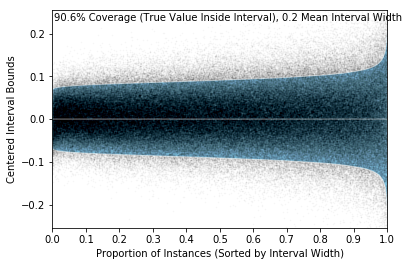

In [58]:
plot_sorted_confidence_error(pr['T'], pr['Y'], pr['minY'], pr['maxY'], alpha=0.03)

In [94]:
# normalize by error
rmses = []
for n,pr in ((n,prSE[EVALSET][n]) for n in estimators):
    rmses += [((pr["T"] - pr["Y"])**2).mean()**0.5]
max_rmse = np.max(rmses)

def binsearch(squared, rmse, eps=1e-4):
    l, u = 0, len(squared)
    part_rmse = np.inf
    while np.abs(part_rmse - rmse) > eps and u-l > 1 :
        m = int((l+u)/2)
        part_rmse = (squared[m:]).mean()**0.5
        if part_rmse < rmse:
            l = m
        else:
            u = m
    return m

nEVALSET = os.path.join(EVALSET,"rmsenormed")
nprSE = {nEVALSET:dict()}
for n,pr in ((n,prSE[EVALSET][n]) for n in estimators):
    # remove good predictions until you match the rmse
    squared = (pr["T"]-pr["Y"])**2
    asc = np.argsort(squared)
    m = binsearch(squared[asc], max_rmse)
    # instance order shouldn't make any difference
    nprSE[nEVALSET][n] = dict((k,v[asc[m:]]) for k,v in pr.items())
    pr = nprSE[nEVALSET][n]
    print(m, ((pr['T'] - pr["Y"])**2).mean()**0.5, n)

for setname in prSE.keys():
    if setname != EVALSET:
        nprSE[setname] = prSE[setname]
    
prSE = nprSE
EVALSET = nEVALSET
print(prSE.keys())

428257 0.37239795671 density
343583 0.372512792797 density_half
454637 0.372535607438 density_stepped
483296 0.372379650301 density_full
272586 0.372427209591 mixture_re
441935 0.372454553646 mixture_half
325 0.372541562074 mixture_stepped
240019 0.372427849281 mixture_full
245556 0.372445934045 doho70
291802 0.37249936773 doho80
338372 0.372418988162 doho90
588976 0.372526526366 ensemble-pairs
485575 0.372502857528 knn-mse
485575 0.372502857528 knn-dev
485575 0.372502857528 knn-vary
dict_keys(['tr', 'va', 'special', 'te/rmsenormed', 'de'])


0.138083152327 0.0405281375705 6702
unimplemented: error precentile regions, requires subsampling check
(200, 666977)
(200, 666977)
0.134722414688 0.0866627732576 11558
unimplemented: error precentile regions, requires subsampling check
(200, 666977)
(200, 666977)
0.0606390883331 0.16318344246 16543
unimplemented: error precentile regions, requires subsampling check
(200, 666977)
(200, 666977)


/home/robert/CPU/lib/python3.5/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


0.0810396410525 0.0495348988285 7023
unimplemented: error precentile regions, requires subsampling check
(200, 666977)
(200, 666977)
0.0517006667214 0.179166074594 9651
unimplemented: error precentile regions, requires subsampling check
(200, 666977)
(200, 666977)
0.0911181041738 0.0565639822045 6986
unimplemented: error precentile regions, requires subsampling check
(200, 666977)
(200, 666977)
0.0836900100694 0.0486655788814 7228
unimplemented: error precentile regions, requires subsampling check
(200, 666977)
(200, 666977)
0.101524142083 0.0538611486091 6720
unimplemented: error precentile regions, requires subsampling check
(200, 666977)
(200, 666977)
0.0503139983048 0.167498757623 16552
unimplemented: error precentile regions, requires subsampling check
(200, 666977)
(200, 666977)
0.081167520606 0.0522615295965 10186
unimplemented: error precentile regions, requires subsampling check
(200, 666977)
(200, 666977)
0.116294126085 0.0826244534015 9248
unimplemented: error precentile reg

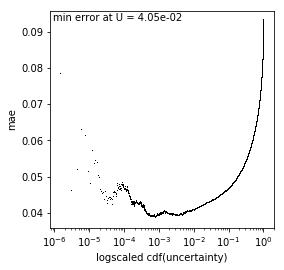

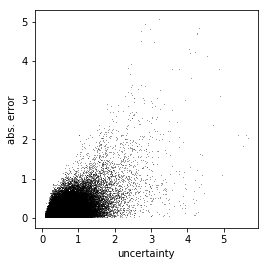

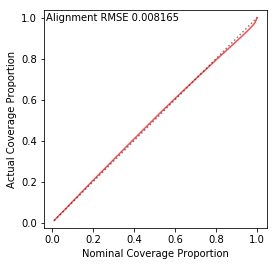

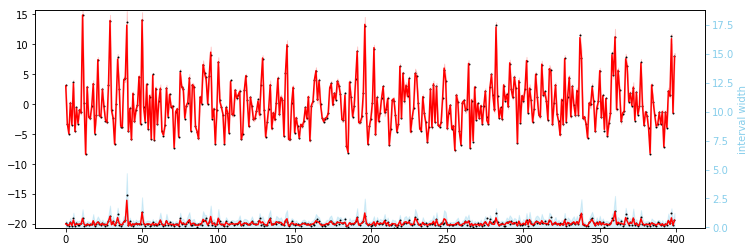

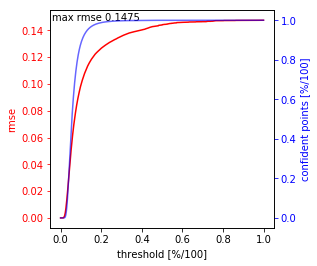

...

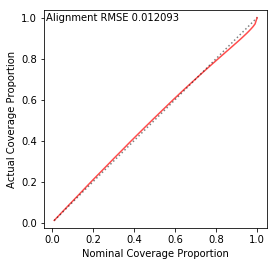

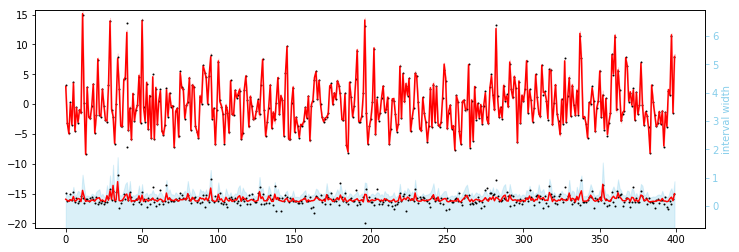

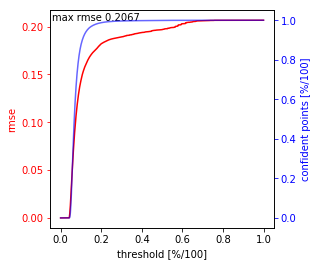

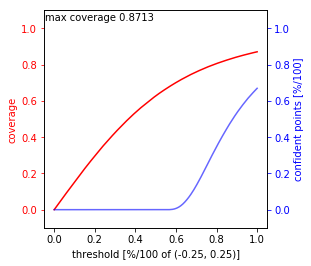

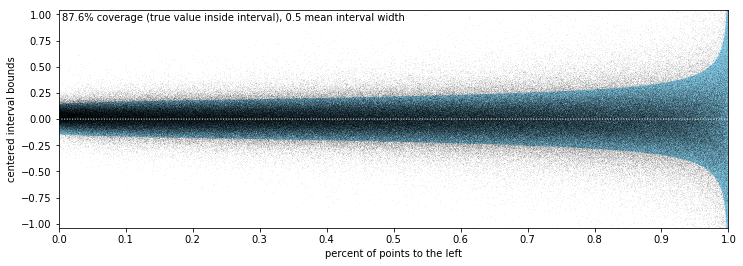

In [51]:
from evaluation import plot
for est, pr in prSE[EVALSET].items():
    figpath = os.path.join('figs',dataset,EVALSET,'unscaled',est)
    plot(pr, figpath)
for est, pr in calibrated['ppf'].items():
    figpath = os.path.join('figs',dataset,EVALSET,'ppf-scaled',est)
    plot(pr, figpath)
for est, pr in calibrated['mean'].items():
    figpath = os.path.join('figs',dataset,EVALSET,'mean-scaled',est)
    plot(pr, figpath)

In [83]:
# try all combinations
# this doesn't significantly improve upon the performance of a single estimator.
# of course errors will be different for each individual neural network instance,
# but that doesn't explain why adding an ensemble variance estimate to a maximum
# likelihood variance does not improve the pearson-r coefficient of the result.
# ensemble variance should be able to detect variance in data regions unaccessible
# to the maximum likelihood minimizer.
# use raw uncertainty scores for this, no normal-, t-, or differently scaled values
import itertools as it
from scores import pearsonr

acr = {
    "density":"S1",
    "density_re":"S1",
    "density_half":"S2",
    "density_stepped":"S3",
    "density_full":"S4",
    "mixture":"M1",
    "mixture_re":"M1",
    "mixture_half":"M2",
    "mixture_stepped":"M3",
    "mixture_full":"M4",
    "doho70": "D7",
    "doho80": "D8",
    "doho90": "D9",
    "dohe70": "E7",
    "dohe80": "E8",
    "dohe90": "E9",
    "ensemble-pairs": "P",
    "ensemble-pairs-balanced": "P*",
    "ensemble-residuals": "R",
    "ensemble-residuals-balanced": "R*",
    "knn-mse": "KE",
    "knn-mseq": "KE*",
    "knn-dev": "KT",
    "knn-avgdist": "KD",
    "knn-vary": "KV"
}

pr_keys = prSE['te']['density'].keys()
def combine(prs, L):
    est = L[0]
    # keys: index T Y minY maxY
    result = dict()
    result['index'] = prs[est]['index'].copy()
    result = dict((k,np.zeros(prs[est][k].shape)) for k in pr_keys)
    for k in ['T', 'Y']:
        result[k] = np.zeros(prs[est][k].shape)
        for e in L:
            result[k] += prs[e][k]
        result[k] /= len(L)
    U = np.zeros(prs[est]['minY'].shape)
    for e in L:
        U += ((prs[e]['maxY'] - prs[e]['minY']) / 2) # variance
#     U = np.sqrt(U)
    result['minY'] = result['Y'] - U
    result['maxY'] = result['Y'] + U
    return result

def rmse(pr):
    return ((pr['T'] - pr['Y'])**2).mean()**0.5

def score(prs, L):
    pr = combine(prs, L)
    return pearsonr(pr['T'], pr['Y'], (pr['maxY'] - pr['minY'])/2)

reference_predictions = prSE[EVALSET]
# reference_predictions = raw
T = []
Tnames = []
baseline_r = np.max([score(reference_predictions, [e]) for e in estimators])
print("best individual r score", baseline_r)
for r in range(1,5):
    for L in it.combinations(estimators, r):
        acronym = " ".join([acr[e] for e in L])
        S = score(reference_predictions, L)
        if S[0] >= baseline_r:
            Tnames += [acronym]
            T += [[S[0], S[1]]]
        print("{:4d} of {:4d}".format(r,len(R)), end='\r')
T = np.array(T)
asc = T[:,0].argsort()
for i in asc[-50:][::-1]:
    print(T[i][0], Tnames[i])

# combPR = dict(va={},te={},de={},sp={})
# R = list(range(1,len(estimators)+1))
# print(R[-1], "estimators")
# for i,r in enumerate(R):
#     for L in it.combinations(estimators, r):
#         acronym = "".join([acr[e] for e in L])
#         combPR['va'][acronym] = combine(va_predictions,L)
#         combPR['te'][acronym] = combine(te_predictions,L)
    

best individual r score 0.679955596466
0.679955596466 S2


In [11]:
for i in range(100): print()